# Classification of Cuisines using Recipe Ingredients - Exploration and Analysis

Food is a massive and complex arena in which culture, geography, climate, and social factors combine to create unique cuisines around the world. With the age of the internet, millions of recipes are now shared instantly and easily accessible. Many ingredients previously specific to certain regions of the world are now also widely available due to online commerce. This project aims to identify the signatures of particular cuisines.

### Objectives

For this section I will attempt to answer the following questions:

1. What are the most frequently used ingredients for each cuisine?
2. Is there any regional or cultural information that can be extracted from the ingredients used in each cuisine?
3. Are there particular ingredients that are often paired together?

In [595]:
# import packages to read and work with data
import pandas as pd
import numpy as np
from collections import defaultdict
from random import shuffle, sample, choice
import operator

# Visualization packages
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

from wordcloud import WordCloud, ImageColorGenerator
from PIL import Image

# Packages for working with text data
from nltk import tokenize
from sklearn.decomposition import TruncatedSVD


In [2]:
# Load the cleaned dataset from the data folder
data = pd.read_pickle('data/data_clean.pkl')

# Preview the first few rows
data.head()

,cuisine,ingredients,words
id,,,
10259,greek,"[feta cheese crumbles, olive, grape tomato, on...","[pepper, crumbles, olive, lettuce, tomato, rom..."
25693,southern_us,"[corn meal, milk, thyme, flour, salt, tomato, ...","[meal, milk, thyme, vegetable, flour, salt, to..."
20130,filipino,"[garlic powder, salt, cooking oil, onion, chic...","[mayonnaise, powder, soy, salt, onion, chicken..."
22213,indian,"[water, salt, vegetable oil]","[wheat, vegetable, salt, water, oil]"
13162,indian,"[milk, bay leaf, shallot, chili powder, garlic...","[leaf, masala, onion, garam, cayenne, yogurt, ..."


The **ingredients** column provides a list of ingredients, while the **words** column provides us with a unique set of words found in each respective ingredients list. We will use both columns for analysis.

Below is a list of all of the cuisines represented in this dataset.

In [3]:
data.cuisine.value_counts()

italian         7835
mexican         6437
southern_us     4317
indian          3002
chinese         2673
french          2643
cajun_creole    1546
thai            1538
japanese        1423
greek           1174
spanish          989
korean           830
vietnamese       825
moroccan         821
british          803
filipino         755
irish            664
jamaican         526
russian          489
brazilian        467
Name: cuisine, dtype: int64

### 1. What are the most frequently used ingredients in each cuisine?

We can get an idea of the ingredients used in each cuisine by splitting ingredients and words by categories.

In [4]:
# Create a list to hold separated ingredients and word lists for each cuisine
cuisines = list(data.cuisine.value_counts().index)

# loop through each entry and separate entries by cuisine
i = 0
for cuisine in data.cuisine.value_counts().index:
    cuisines[i] = data[data.cuisine == cuisine]
    i += 1

Now that we have separated the lists by cuisine, it's a pretty straightforward task to analyze each 

In [5]:
cuisines[1].head()

,cuisine,ingredients,words
id,,,
16903,mexican,"[pepper, jalapeno pepper, corn tortilla, salt,...","[cilantro, tortilla, fresh, poblano, olive, ch..."
41995,mexican,"[cilantro, coriander, chili powder, cinnamon, ...","[cilantro, powder, coriander, flank, olive, ch..."
40523,mexican,"[cilantro, salt, rom tomato, lime, onion, jala...","[cilantro, pepper, salt, tomato, lime, onion, ..."
1299,mexican,"[cheese, flour tortilla, egg]","[tortilla, flour, sausage, cheese, egg]"
10276,mexican,"[garlic powder, chili powder, sea salt, cumin,...","[powder, sea, chili, salt, cumin, onion, papri..."


We will use a collection of wordclouds since: 1) They are a pretty good way to visualize the most common ingredients found in any subset of our data, and 2) They are really fun.

Below are a collection of wordclouds generated from their respective ingredients lists.

In [128]:
cuisine_ingredients = defaultdict(list)
cuisine_words = defaultdict(list)
world_ingredients = []

for category in cuisines:
    cuisine = category.cuisine.head(1).values[0]
    for ingredients in category.ingredients:
        cuisine_ingredients[cuisine] += ingredients
        
for i in data.ingredients:    
    world_ingredients.extend(i)

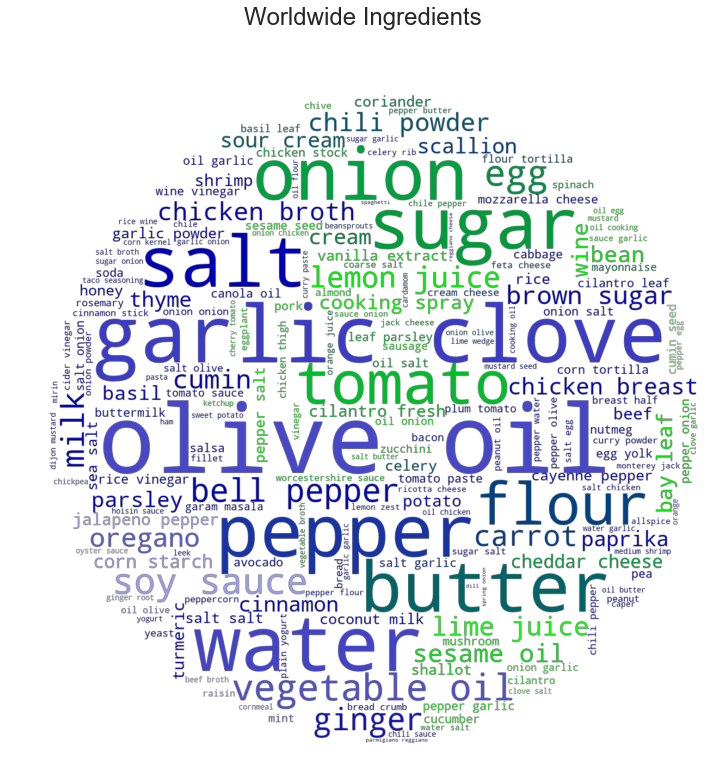

In [129]:
# Create a wordcloud to show most common ingredients worldwide
text = ', '.join(sample(world_ingredients, len(world_ingredients)))

# load data for mask
mask = np.array(Image.open('data/masks/world.jpg'))
image_colors = ImageColorGenerator(mask)

# Generate wordcloud using text
wc = WordCloud(background_color=None,
               mode='RGBA',
               color_func=image_colors,
               mask=mask).generate(text)

# create plot of wordcloud
plt.subplots(figsize=(12,12))
plt.imshow(wc, interpolation='bilinear')
plt.suptitle('Worldwide Ingredients', fontsize=24)
plt.axis("off")

# Save the wordcloud to a file
plt.savefig('data/wordclouds/world.png', format='png', dpi=100)

plt.show()

In [8]:
# create dictionary for colormaps of each cuisine place of origin
cuisine_colors = dict(zip(cuisine_ingredients.keys(), ['RdYlGn', 'RdYlGn', 'seismic', 'BrBG',
                                                       'autumn', 'seismic', 'Blues', 'coolwarm',
                                                       'Reds', 'Blues', 'autumn', 'bwr', 'autumn',
                                                       'RdYlGn', 'bwr', 'RdYlBu', 'BrBG', 'summer',
                                                       'coolwarm', 'summer']))

In [611]:
def make_word_clouds(cuisine_list, dictionary, cuisine_colors=cuisine_colors):
    """
    This function displays word clouds based on term frequency and cuisine category
    """
    
    for i in range(len(cuisine_list)):
        #plt.subplot(rows, 2, i+1)
        # Combine all ingredients into single string
        to_shuffle = dictionary[cuisine_list[i]]
        shuffle(to_shuffle)
        text = ', '.join(to_shuffle)

        # load data from path
        open_path = 'data/masks/' + cuisine_list[i] + '.jpg'
        mask = np.array(Image.open(open_path))
        
        # Generate wordcloud using text
        wc = WordCloud(background_color=None,
                       mode='RGBA',
                       colormap=cuisine_colors[cuisine_list[i]],
                       mask=mask).generate(text)

        # create plot of wordcloud
        plt.subplots(figsize=(12,12))
        plt.imshow(wc, interpolation='bilinear')
        plt.suptitle(cuisine_list[i].title(), fontsize=24)
        plt.axis("off")
        
        # Save the wordcloud to a file
        save_path = 'data/wordclouds/' + cuisine_list[i] + '.png'
        plt.savefig(save_path, format='png', dpi=100)

        plt.show()

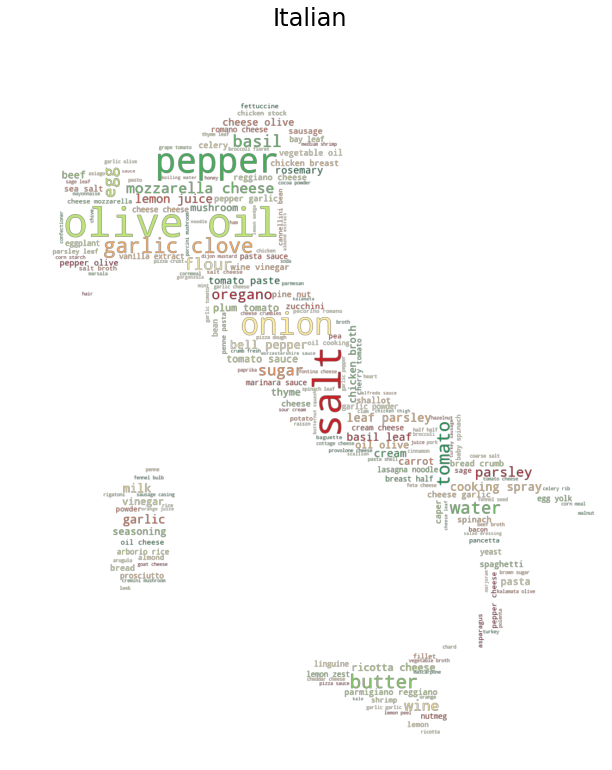

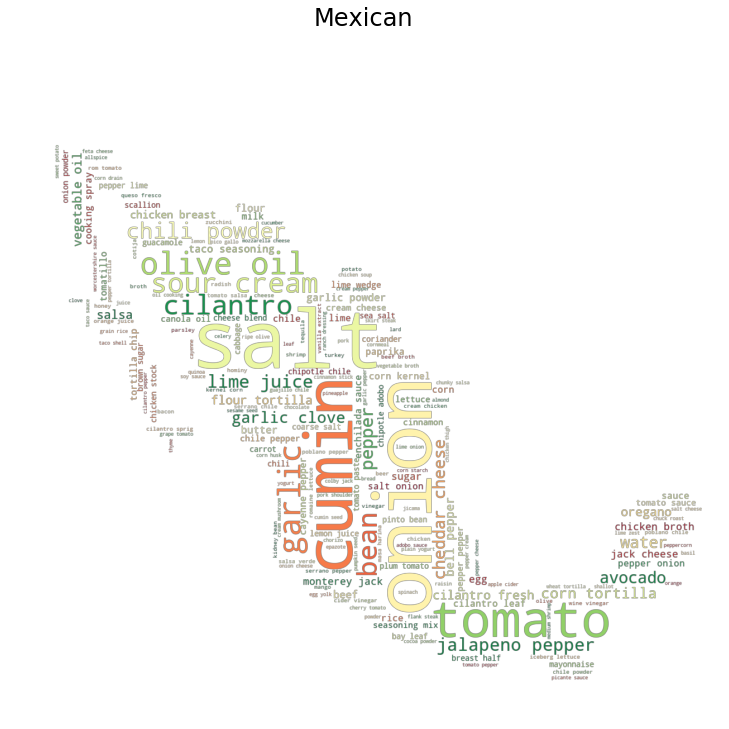

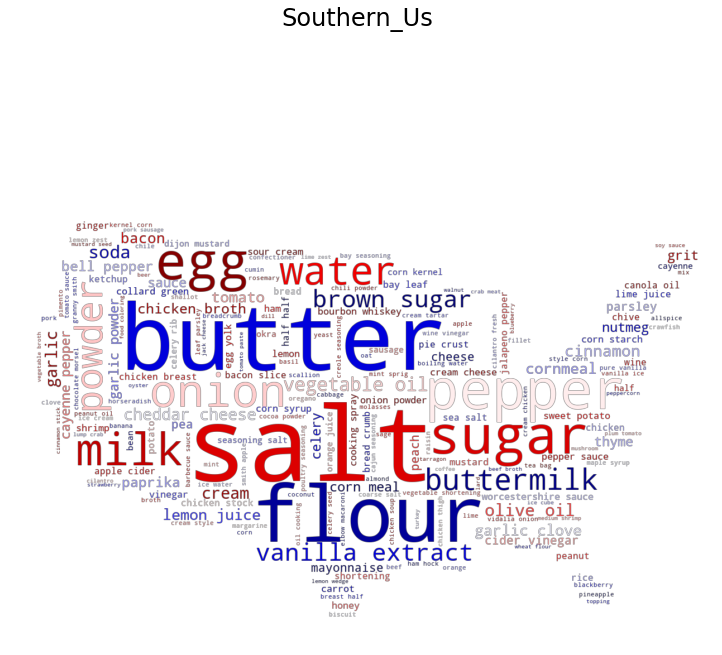

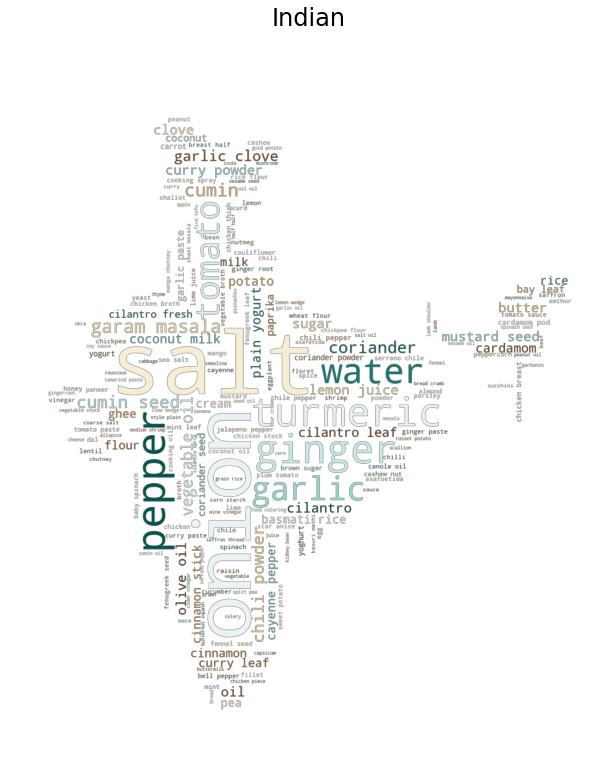

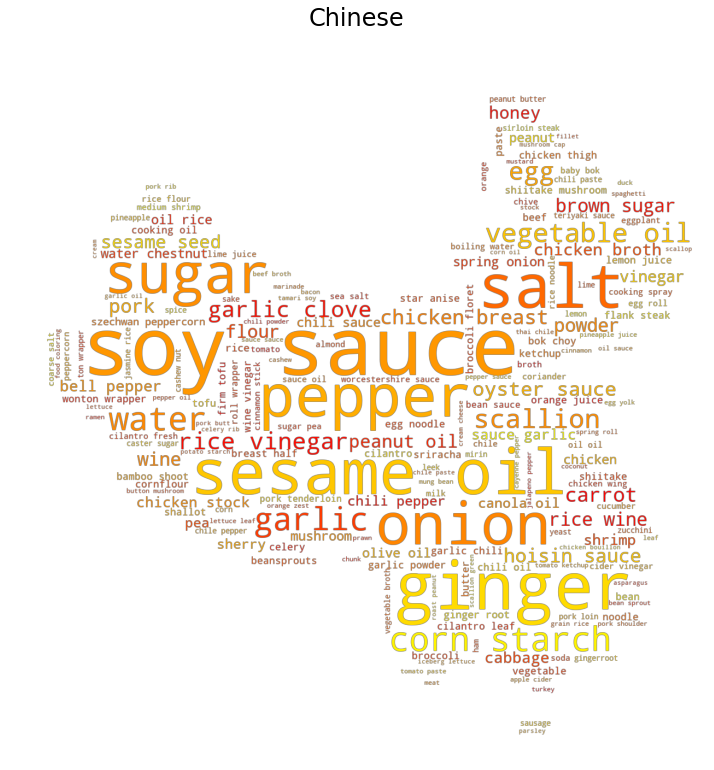

...

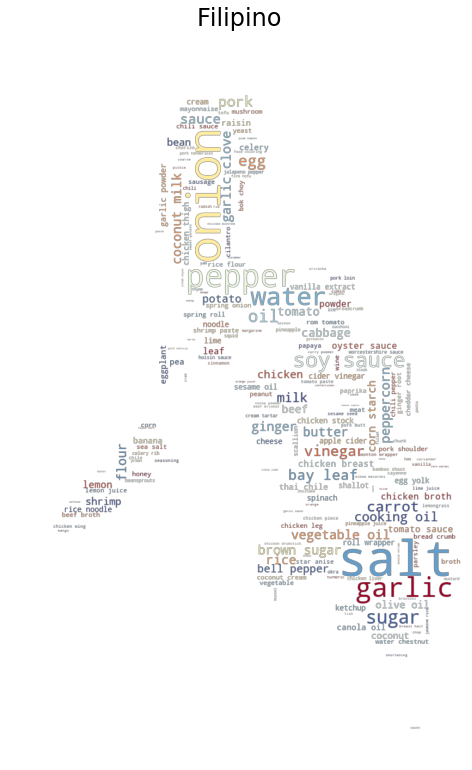

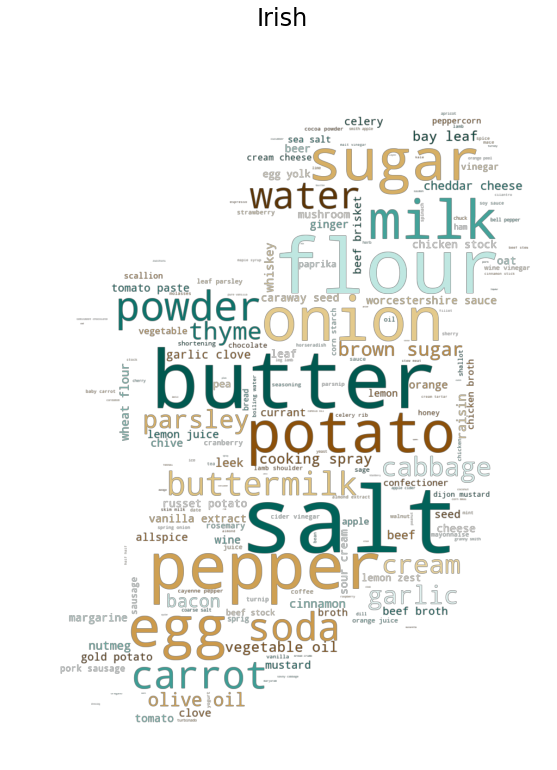

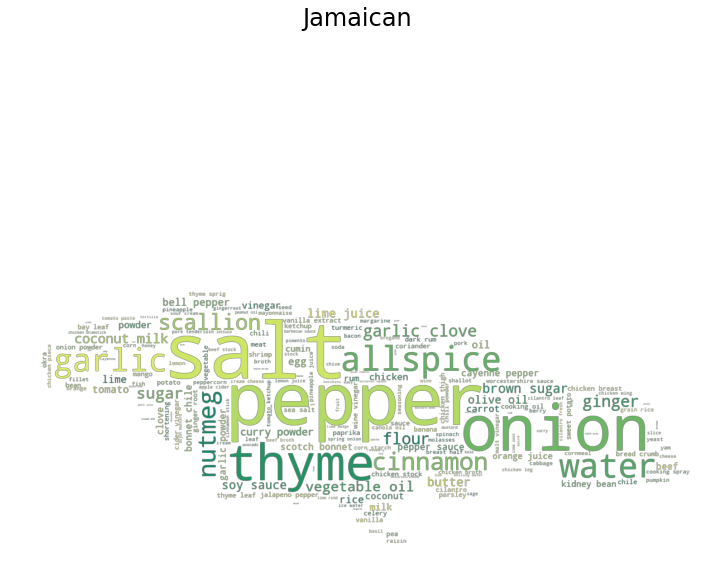

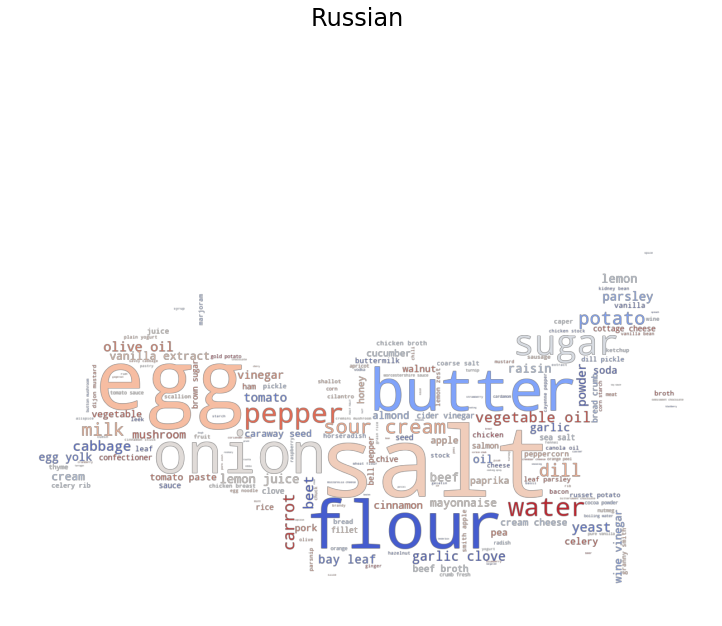

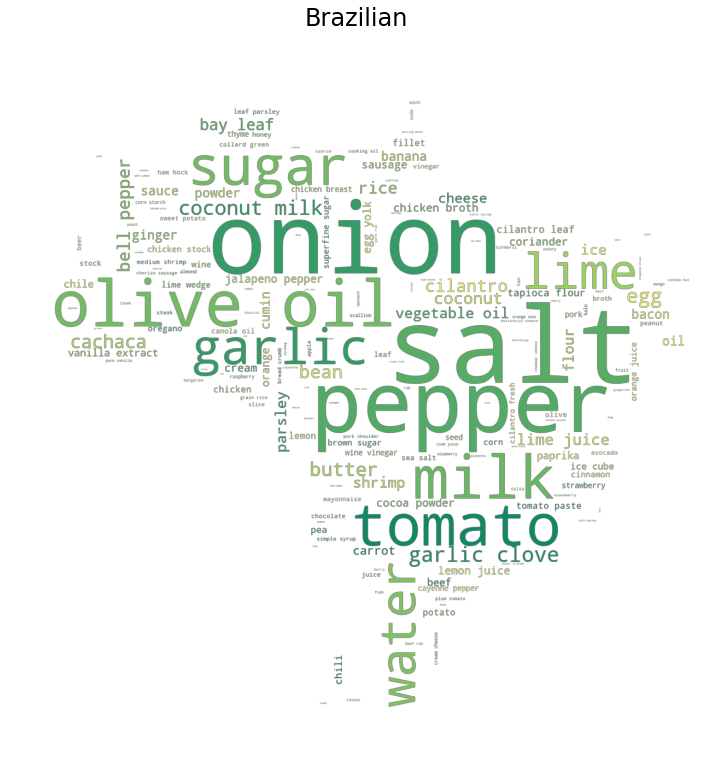

In [10]:
cuisine_list = list(cuisine_ingredients.keys())

make_word_clouds(cuisine_list, cuisine_ingredients)

There are a few things we can see by looking briefly through the wordclouds above. Firstly, ingredients like salt and onions seem to be ubiquitous, represented in every cuisine of our dataset. Alternatively, there are some clearly unique ingredients widely used in some cuisines, such as cumin in Mexican recipes, turmeric in Indian, soy sauce in Asian cuisines such as Japanese and Chinese, coconut milk in Thai and lime in Brazilian cuisine. These standouts may definitely help us to build a model of cuisine prediction later on, if they can be weighted more importantly than those which appear in all cuisines.

We can also see rankings of the average lengths of ingredients lists for each cuisine to get an idea of which cuisines enjoy more complex dishes than others.

In [11]:
# Create a dictionary to hold lengths of ingredients
ingredient_lengths = defaultdict(list)

for i in range(len(cuisines)):
    # Identify category of cuisine
    category = cuisines[i].cuisine.head(1).values[0]
    temp_list = []
    # Append lengths of recipes for each cuisine to ingredient_lengths
    for recipe in cuisines[i].ingredients:
        temp_list.append(len(recipe))
        
    ingredient_lengths[category] = temp_list

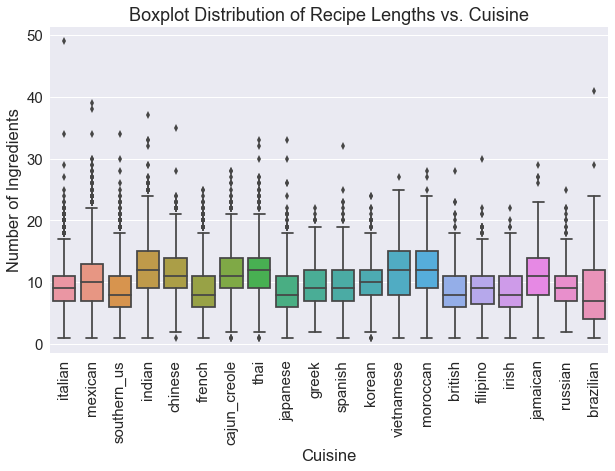

In [12]:
sns.set(font_scale=1.5)

plt.subplots(figsize=(10, 6))
sns.boxplot(data=list(ingredient_lengths.values()))
plt.xticks(range(len(ingredient_lengths.keys())), list(ingredient_lengths.keys()), rotation='vertical')
plt.title('Boxplot Distribution of Recipe Lengths vs. Cuisine')
plt.xlabel('Cuisine')
plt.ylabel('Number of Ingredients')

plt.show()

This graph shows a nice distribution of ingredient length statistics, but it would be more convient to have an ordered version for comparison.

In [13]:
mean_lengths = []
for key in ingredient_lengths.keys():
    mean_lengths.append(np.mean(ingredient_lengths[key]))

sorted_lengths = [i[0] for i in sorted(enumerate(mean_lengths), key=lambda x:x[1], reverse=True)]
print(sorted_lengths)

[13, 3, 7, 12, 6, 4, 17, 11, 1, 10, 9, 18, 0, 15, 5, 8, 2, 14, 16, 19]


In [14]:
sorted_ingredient_keys = [list(ingredient_lengths.keys())[x] for x in sorted_lengths]
print(sorted_ingredient_keys)

sorted_ingredient_lengths = [list(ingredient_lengths[key]) for key in sorted_ingredient_keys]

['moroccan', 'indian', 'thai', 'vietnamese', 'cajun_creole', 'chinese', 'jamaican', 'korean', 'mexican', 'spanish', 'greek', 'russian', 'italian', 'filipino', 'french', 'japanese', 'southern_us', 'british', 'irish', 'brazilian']


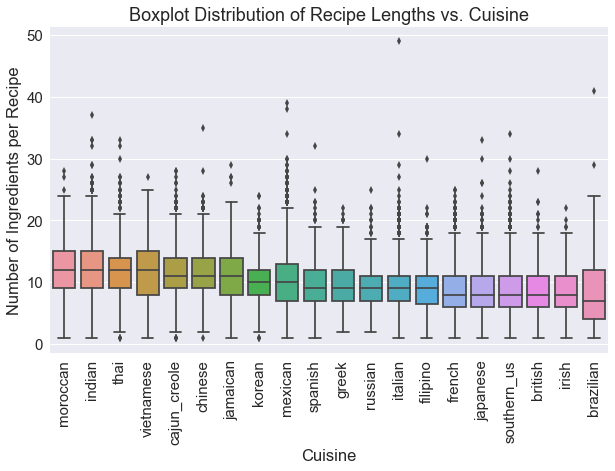

In [20]:
plt.subplots(figsize=(10, 6))
sns.boxplot(data=sorted_ingredient_lengths)
plt.xticks(range(len(sorted_ingredient_keys)), sorted_ingredient_keys, rotation='vertical')
plt.title('Boxplot Distribution of Recipe Lengths vs. Cuisine')
plt.xlabel('Cuisine')
plt.ylabel('Number of Ingredients per Recipe')

plt.show()

It looks like cuisines like Moroccan, Indian and Thai use the most ingredients per recipe, while British, Irish and Brazilian cuisines have slightly simpler recipe lists.

It may also be useful to see which cuisines use the widest variety of ingredients to get an idea of the breadth of ingredients or flavors that make up each cuisine.

In [108]:
# List number of unique ingredients for each cuisine
unique_cuisine_ingredients = defaultdict(int)

for i in range(len(sorted_ingredient_keys)):
    unique_cuisine_ingredients[sorted_ingredient_keys[i]] = len(set(cuisine_ingredients[sorted_ingredient_keys[i]]))

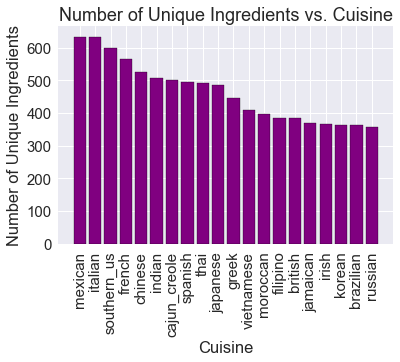

In [111]:
# Generate plot to visualize the unique ingredients per cuisine
unique_cuisine_ingredient_keys = sorted(unique_cuisine_ingredients, key=unique_cuisine_ingredients.get, reverse=True)
unique_cuisine_ingredient_list = [unique_cuisine_ingredients[x] for x in unique_cuisine_ingredient_keys]

plt.bar(range(len(unique_cuisine_ingredient_list)), unique_cuisine_ingredient_list, edgecolor='k', facecolor='purple')
plt.xticks(range(len(unique_cuisine_ingredient_list)), unique_cuisine_ingredient_keys, rotation='vertical')
plt.xlabel('Cuisine')
plt.ylabel('Number of Unique Ingredients')
plt.title('Number of Unique Ingredients vs. Cuisine')
plt.show()

We can see that although Moroccan, Indian and Thai lead with the most ingredients per recipe, the kitchens of Mexican, Italian and Southern U.S. cuisines are stocked with a larger variety of ingredients in our dataset. In all cases, Brazilian cuisine tends to be a simpler affair.


### Preparing data for Vectorization (TF-IDF weighted Processing)

While the visualizations above are nice, ubiquitous ingredients such as onion, salt, and garlic tend to obscure the ingredients unique to each cuisine. In order to account for this distribution and extract the ingredients that form a "signature" of each cuisine, we will use TF-IDF weighting which will give higher importanct to words which mainly appear in their respective category, and not across many cuisines.

Before we can proceed to apply this weighting to our cuisine ingredient lists, the ingredient lists for recipes of each cuisine will be normalized to be approximately the same length to adjust for cuisines that have a wide difference in the number of recipes represented. We will choose a random sample set of 20,000 ingredients for each cuisine for our analysis (the mean ingredients for all recipes is ~10, so this approximates about 2,000 recipes each).

In [148]:
# Generate samples to create cuisine ingredient lists of equal length
normed_cuisine_ingredients = defaultdict(list)
for cuisine in cuisine_list:
    normed_cuisine_ingredients[cuisine] = ', '.join(list(np.random.choice(cuisine_ingredients[cuisine], size=20000)))

In [457]:
# Create list of ingredient strings to pass to TF-IDF
normed_cuisine_keys = list(sorted(normed_cuisine_ingredients.keys()))
normed_cuisines_list = [normed_cuisine_ingredients[x] for x in normed_cuisine_keys]

# Custom tokenizer to separate list into tokens by commas
tokenized = tokenize.regexp.RegexpTokenizer(pattern=", ", gaps=True)

# Create TF-IDF weighting dictionary for each cuisine, exclude terms that appear in every cuisine
tfidf = TfidfVectorizer(tokenizer=tokenized.tokenize, max_df=0.95)

# Fit and transform cuisine ingredient lists to generate sparse matrix
cuisines_weighted = tfidf.fit_transform(normed_cuisines_list)

In [567]:
# Plot feature importances for top 10 features of each cuisine
def plot_top_ingredients(sparse_matrix):
    
    plt.subplots(figsize=(14,60))
    
    for i in range(sparse_matrix.shape[0]):
        top_ingredients = []
        top_scores = []
        top_indices = sorted([x for x in range(len(tfidf.get_feature_names()))], key=lambda x: cuisines_weighted[i, x], reverse=True)
        
        for index in top_indices[:10]:
            top_ingredients.append(tfidf.get_feature_names()[index])
            top_scores.append(cuisines_weighted[i, index])
        
        plt.subplot(10, 2, i+1)
        plt.bar(range(10), top_scores, edgecolor='k')
        plt.ylabel('TF-IDF Score')
        plt.title(normed_cuisine_keys[i].title())
        plt.xticks(range(10), top_ingredients, rotation='vertical')
        
    plt.tight_layout()
    plt.show()

        

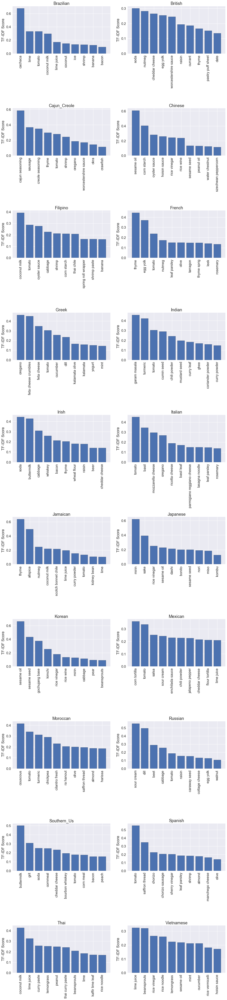

In [504]:
plot_top_ingredients(cuisines_weighted)

The plots above show us a much better representation of which ingredients form the unique signature of each cuisine. We can also use this grouping to see how similar cuisines are, as shown below.

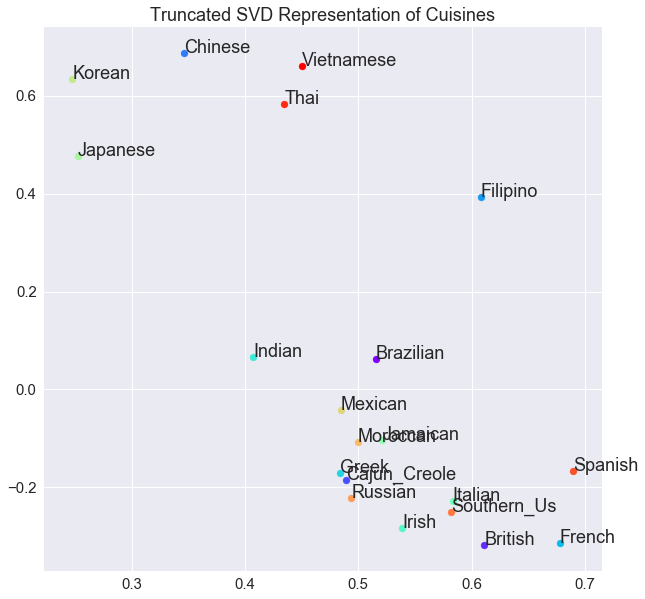

In [546]:
# Project the vectors onto 2 dimensional space
svd = TruncatedSVD()
docs = svd.fit_transform(cuisines_weighted)

# Create colors and labels for cuisines
colors = iter(cm.rainbow(np.linspace(0, 1, docs.shape[0])))
labels = iter(normed_cuisine_keys)

# Create a scatterplot visualizing similarities between cuisines
plt.subplots(figsize=(10, 10))
for x, y in docs:
    plt.scatter(x, y, color=next(colors))
    plt.annotate(s=next(labels).title(), xy=(x, y))
    
plt.title('Truncated SVD Representation of Cuisines')
plt.show()

Great! Although we've input nothing beyond labels and recipe ingredients, we can see that the visualization has naturally grouped together cuisines that are similar! Geography seems to play a role, since many Eastern and Western countries are grouped closely, and we can see the cuisines that best bridge the gap between these two, such as Filipino and Indian cuisines!

Now that we seem to have isolated the valuable data, we can return to our wordclouds and generate wordclouds that accurately depict the signature ingredients of each cuisine.

In [588]:
# Create a dictionary similar to cuisine_ingredients, with proportions according to tf-idf scores
weighted_cuisine_ingredients = defaultdict(list)

for i in range(cuisines_weighted.shape[0]):
    ingredients_temp = []
    indices = sorted([x for x in range(len(tfidf.get_feature_names()))], key=lambda x: cuisines_weighted[i, x], reverse=True)
    total_score = sum([cuisines_weighted[i, x] for x in range(len(indices))])
    
    for index in indices:
        scores_temp = cuisines_weighted[i, index]
        ingredients_temp.extend([tfidf.get_feature_names()[index]] * int(20000*scores_temp/total_score))
    weighted_cuisine_ingredients[normed_cuisine_keys[i]] = ingredients_temp

In [148]:
# Generate samples to create cuisine ingredient lists of equal length
normed_cuisine_ingredients = defaultdict(list)
for cuisine in cuisine_list:
    normed_cuisine_ingredients[cuisine] = ', '.join(list(np.random.choice(cuisine_ingredients[cuisine], size=20000)))

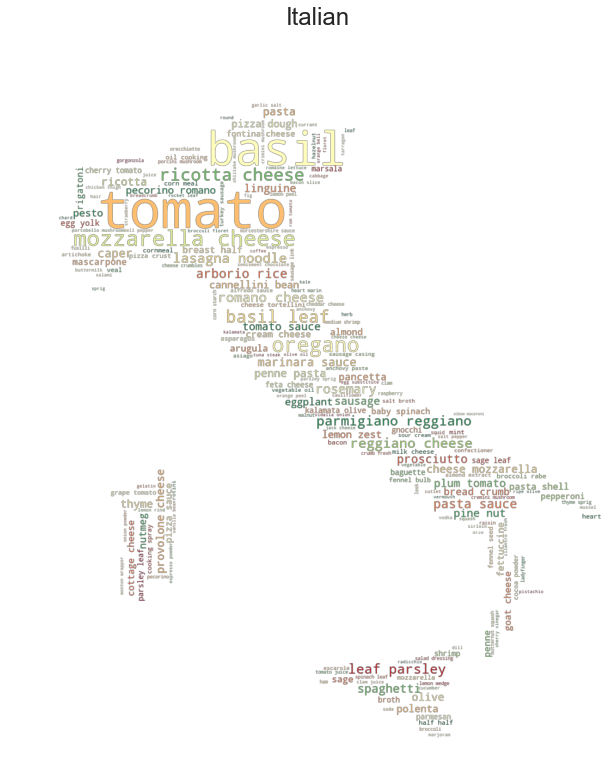

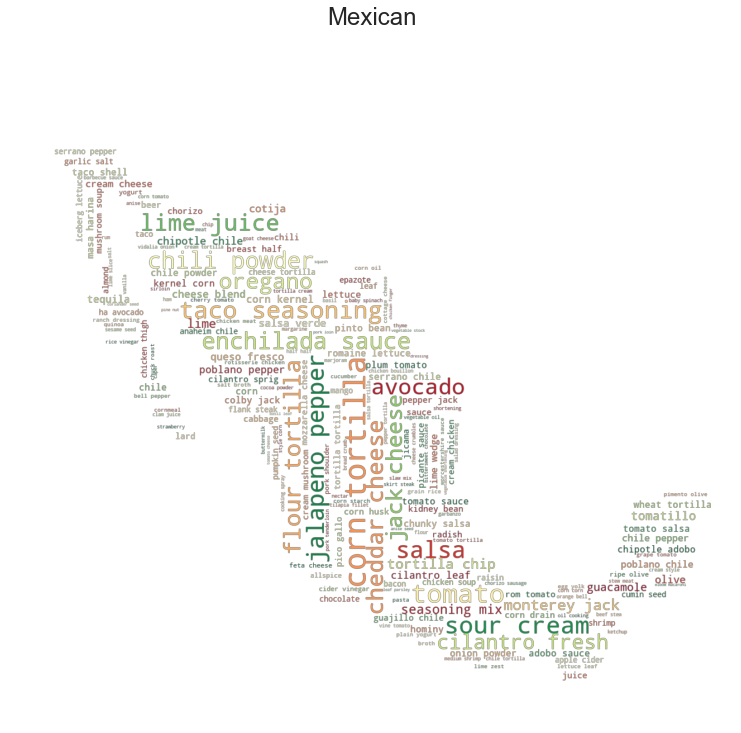

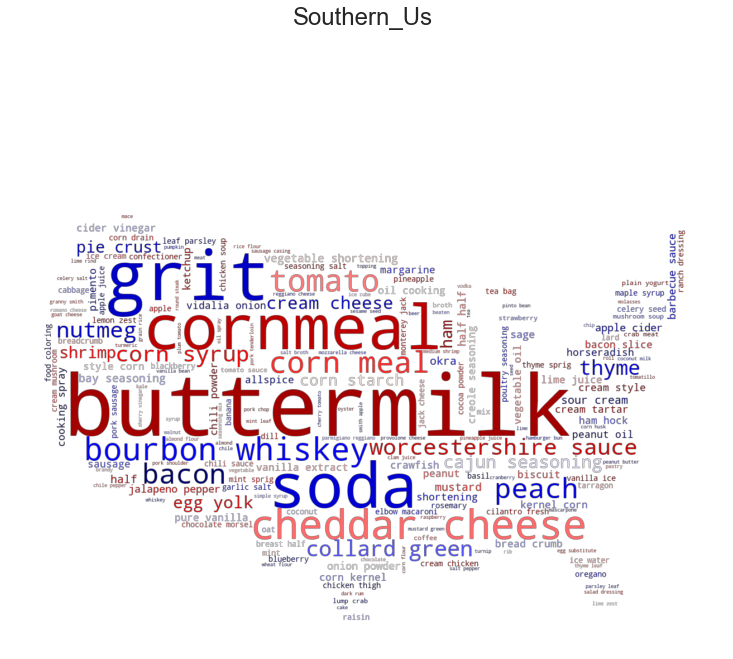

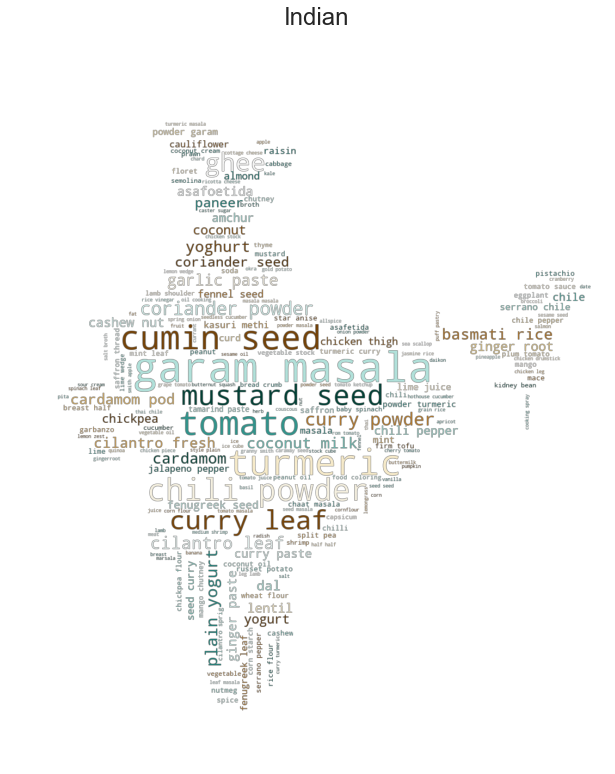

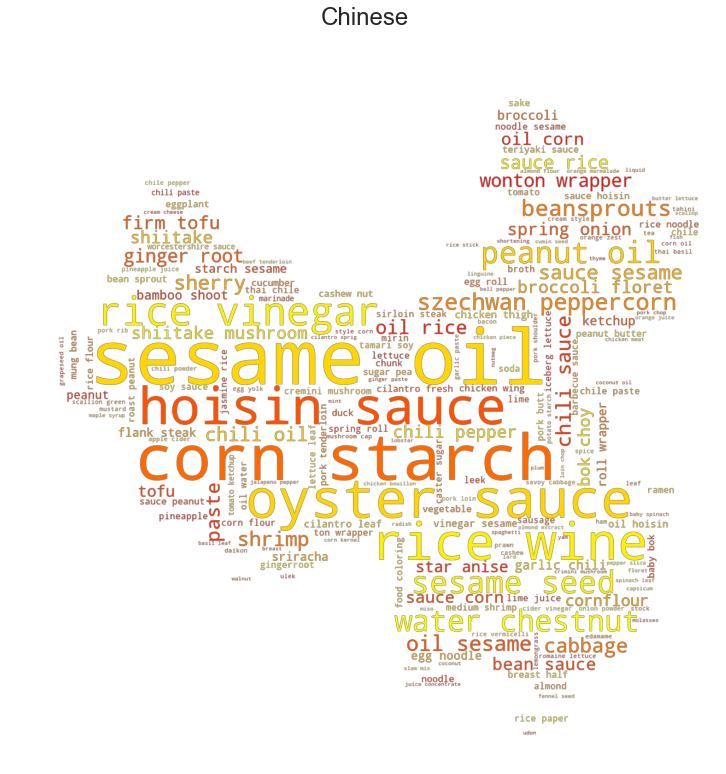

...

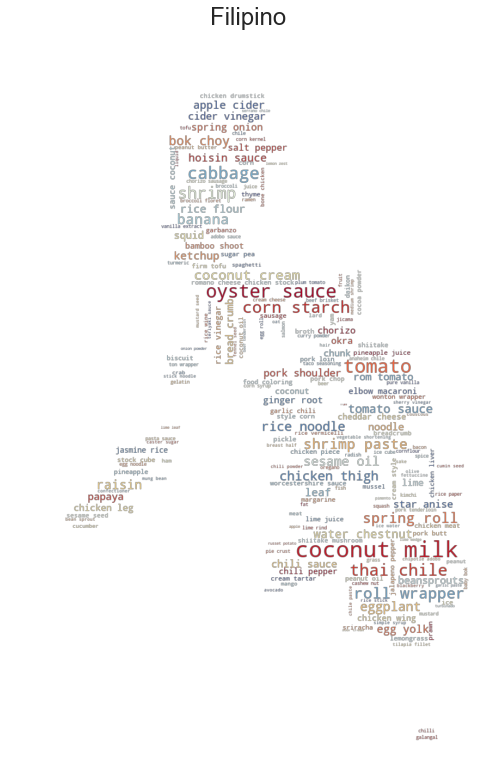

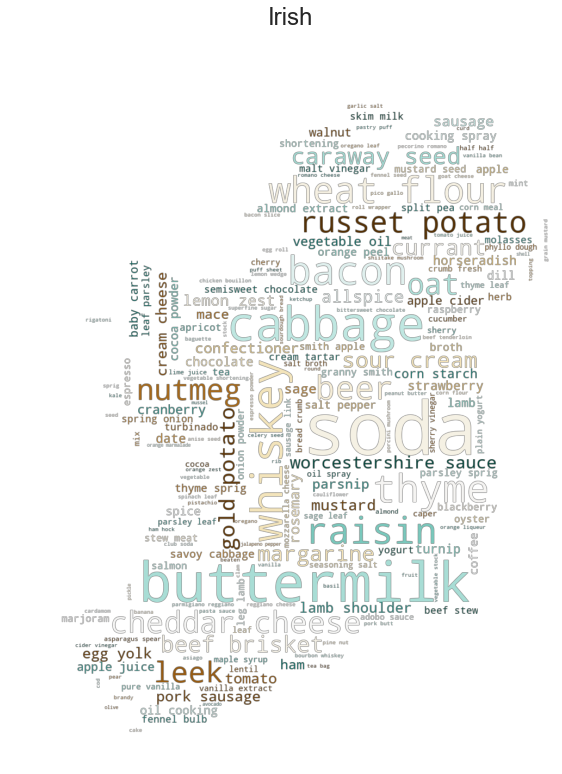

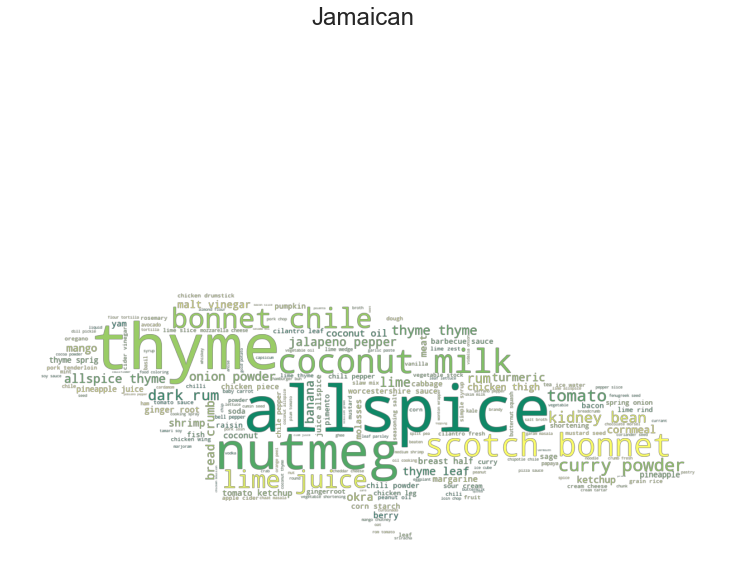

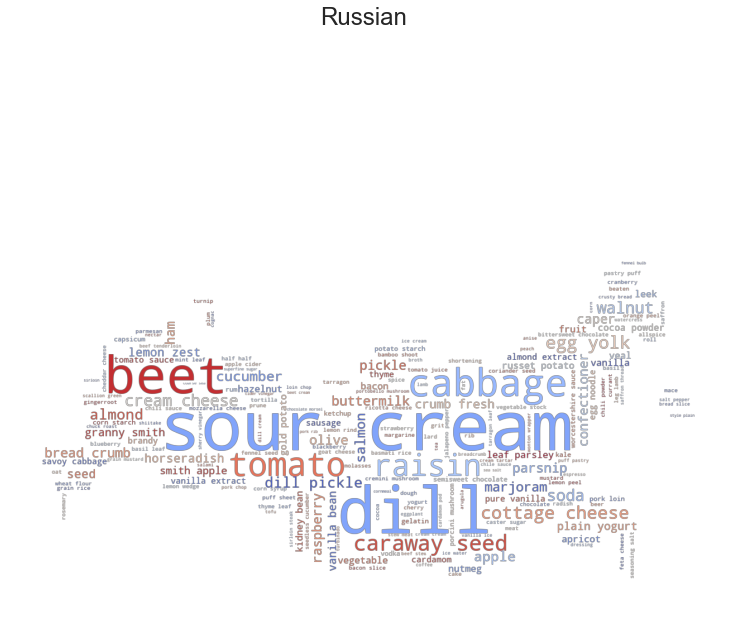

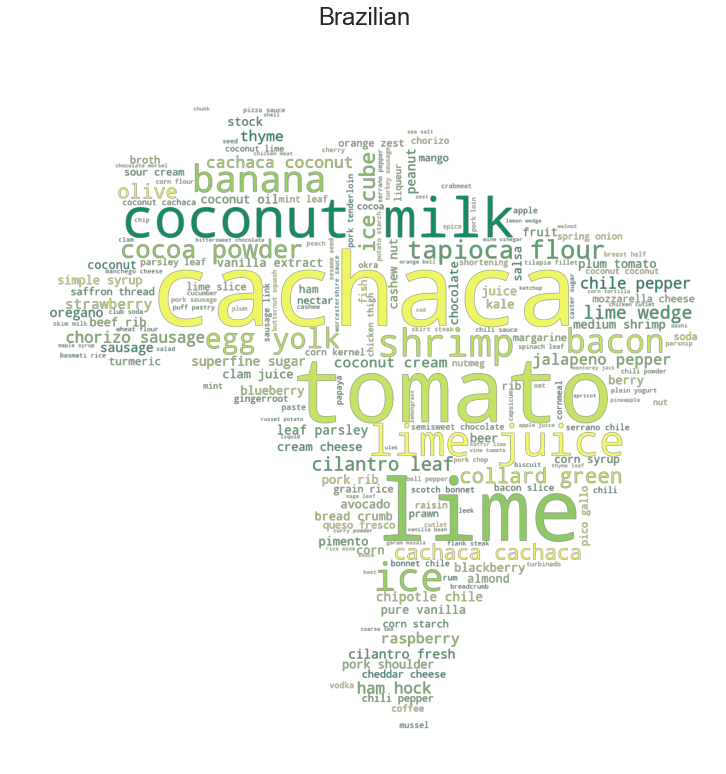

In [613]:
make_word_clouds(cuisine_list, weighted_cuisine_ingredients)

### Combined TF-IDF

Now that we have looked at ingredients grouped together by their cuisine, we can perform a similar representation and visualization by processing each recipe individually into a TF-IDF weighted format.

...To Be Continued